In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as ex

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
df=pd.read_csv('credit_risk_dataset.csv')
df.head(2)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2


## Dataset Understanding

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32581 entries, 0 to 32580
Data columns (total 12 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   person_age                  32581 non-null  int64  
 1   person_income               32581 non-null  int64  
 2   person_home_ownership       32581 non-null  object 
 3   person_emp_length           31686 non-null  float64
 4   loan_intent                 32581 non-null  object 
 5   loan_grade                  32581 non-null  object 
 6   loan_amnt                   32581 non-null  int64  
 7   loan_int_rate               29465 non-null  float64
 8   loan_status                 32581 non-null  int64  
 9   loan_percent_income         32581 non-null  float64
 10  cb_person_default_on_file   32581 non-null  object 
 11  cb_person_cred_hist_length  32581 non-null  int64  
dtypes: float64(3), int64(5), object(4)
memory usage: 3.0+ MB


In [5]:
df.isnull().sum()

person_age                       0
person_income                    0
person_home_ownership            0
person_emp_length              895
loan_intent                      0
loan_grade                       0
loan_amnt                        0
loan_int_rate                 3116
loan_status                      0
loan_percent_income              0
cb_person_default_on_file        0
cb_person_cred_hist_length       0
dtype: int64

## Exploratory Data Analysis

In [6]:
df.describe()

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,31686.000000,32581.000000,29465.000000,32581.000000,32581.000000,32581.000000
mean,27.734600,6.607485e+04,4.789686,9589.371106,11.011695,0.218164,0.170203,5.804211
std,6.348078,6.198312e+04,4.142630,6322.086646,3.240459,0.413006,0.106782,4.055001
min,20.000000,4.000000e+03,0.000000,500.000000,5.420000,0.000000,0.000000,2.000000
25%,23.000000,3.850000e+04,2.000000,5000.000000,7.900000,0.000000,0.090000,3.000000
50%,26.000000,5.500000e+04,4.000000,8000.000000,10.990000,0.000000,0.150000,4.000000
75%,30.000000,7.920000e+04,7.000000,12200.000000,13.470000,0.000000,0.230000,8.000000
max,144.000000,6.000000e+06,123.000000,35000.000000,23.220000,1.000000,0.830000,30.000000


In [7]:
df.describe(include='all')

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
count,32581.000000,3.258100e+04,32581,31686.000000,32581,32581,32581.000000,29465.000000,32581.000000,32581.000000,32581,32581.000000
unique,NaN,NaN,4,NaN,6,7,NaN,NaN,NaN,NaN,2,NaN
top,NaN,NaN,RENT,NaN,EDUCATION,A,NaN,NaN,NaN,NaN,N,NaN
freq,NaN,NaN,16446,NaN,6453,10777,NaN,NaN,NaN,NaN,26836,NaN
mean,27.734600,6.607485e+04,NaN,4.789686,NaN,NaN,9589.371106,11.011695,0.218164,0.170203,NaN,5.804211
std,6.348078,6.198312e+04,NaN,4.142630,NaN,NaN,6322.086646,3.240459,0.413006,0.106782,NaN,4.055001
min,20.000000,4.000000e+03,NaN,0.000000,NaN,NaN,500.000000,5.420000,0.000000,0.000000,NaN,2.000000
25%,23.000000,3.850000e+04,NaN,2.000000,NaN,NaN,5000.000000,7.900000,0.000000,0.090000,NaN,3.000000
50%,26.000000,5.500000e+04,NaN,4.000000,NaN,NaN,8000.000000,10.990000,0.000000,0.150000,NaN,4.000000
75%,30.000000,7.920000e+04,NaN,7.000000,NaN,NaN,12200.000000,13.470000,0.000000,0.230000,NaN,8.000000


## Univariate Analysis

### person_age

In [8]:
df['person_age'].min()

20

In [9]:
df['person_age'].max()

144

In [10]:
df['person_age'].mode()

0    23
dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

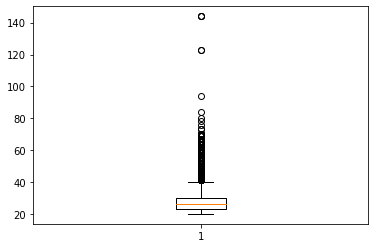

In [11]:
plt.boxplot(df['person_age'])
plt.show

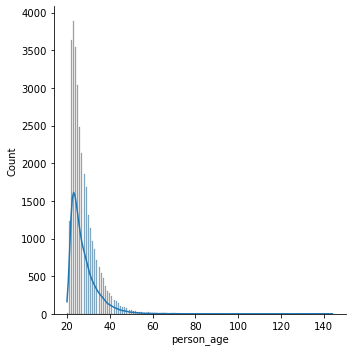

In [12]:
sns.displot(data=df,x='person_age',kde=True)
plt.show()

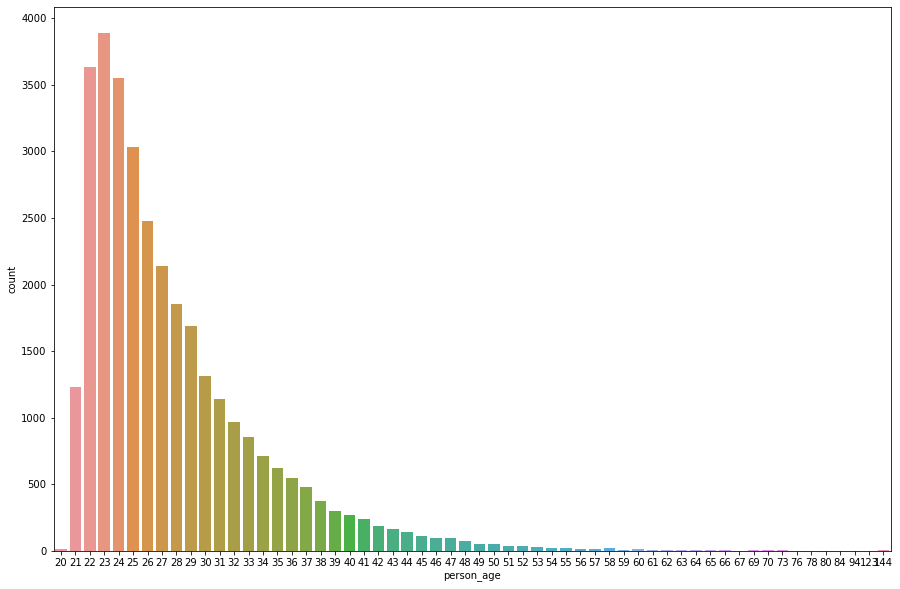

In [13]:
plt.figure(figsize=(15,10))
sns.countplot(df['person_age'])
plt.show()

In [14]:
df['person_age'].nlargest(n=10)

81       144
183      144
32297    144
575      123
747      123
32416     94
32506     84
32422     80
32355     78
32534     76
Name: person_age, dtype: int64

### person_income

In [15]:
df['person_income'].min()

4000

In [16]:
df['person_income'].max()

6000000

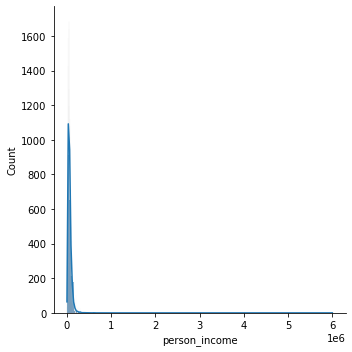

In [17]:
sns.displot(data=df,x='person_income',kde=True)
plt.show()

### person_home_ownership

In [18]:
print(df['person_home_ownership'].unique())

['RENT' 'OWN' 'MORTGAGE' 'OTHER']


In [19]:
print("max:",df['person_home_ownership'].max())
print("min:",df['person_home_ownership'].min())

max: RENT
min: MORTGAGE


In [20]:
df['person_home_ownership'].value_counts()

RENT        16446
MORTGAGE    13444
OWN          2584
OTHER         107
Name: person_home_ownership, dtype: int64

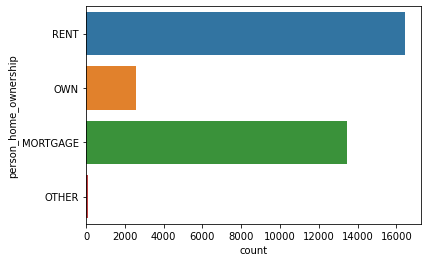

In [21]:
sns.countplot(y='person_home_ownership',data=df)
plt.show()

### person_emp_length

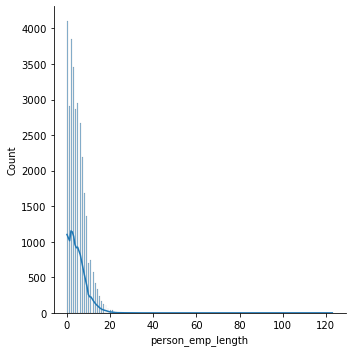

In [22]:
sns.displot(data=df,x='person_emp_length',kde=True)
plt.show()

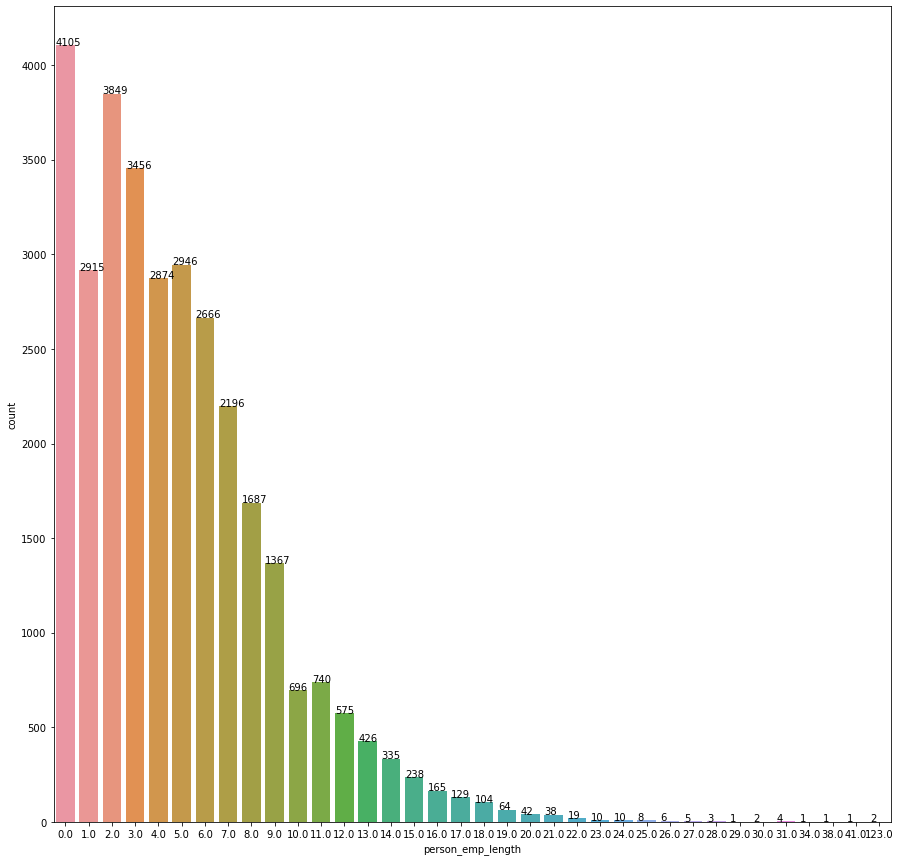

In [23]:
plt.figure(figsize=(15,15))
ax = sns.countplot(x='person_emp_length', data=df)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0, p.get_height()+0))

plt.show()

### loan_intent

In [24]:
df['loan_intent'].unique()

array(['PERSONAL', 'EDUCATION', 'MEDICAL', 'VENTURE', 'HOMEIMPROVEMENT',
       'DEBTCONSOLIDATION'], dtype=object)

In [25]:
df['loan_intent'].value_counts()

EDUCATION            6453
MEDICAL              6071
VENTURE              5719
PERSONAL             5521
DEBTCONSOLIDATION    5212
HOMEIMPROVEMENT      3605
Name: loan_intent, dtype: int64

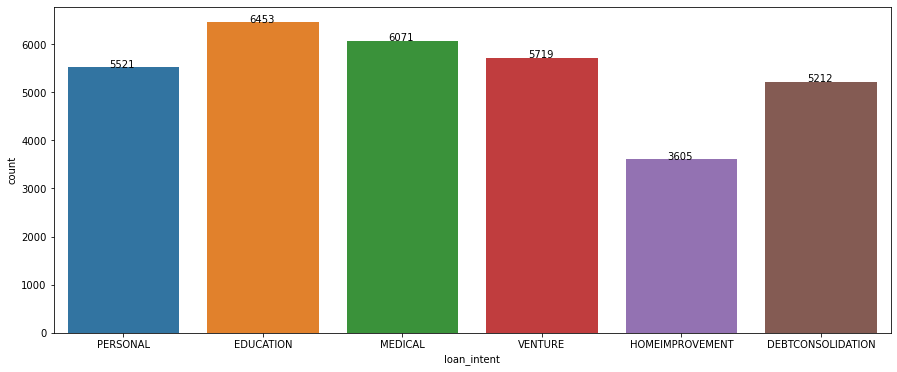

In [26]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='loan_intent', data=df)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

In [27]:
ex.pie(df,names='loan_intent',title='Propotion Of Loan Intent',hole=0.33)

### loan_grade

In [28]:
print(df['loan_grade'].nunique())
print(df['loan_grade'].unique())

7
['D' 'B' 'C' 'A' 'E' 'F' 'G']


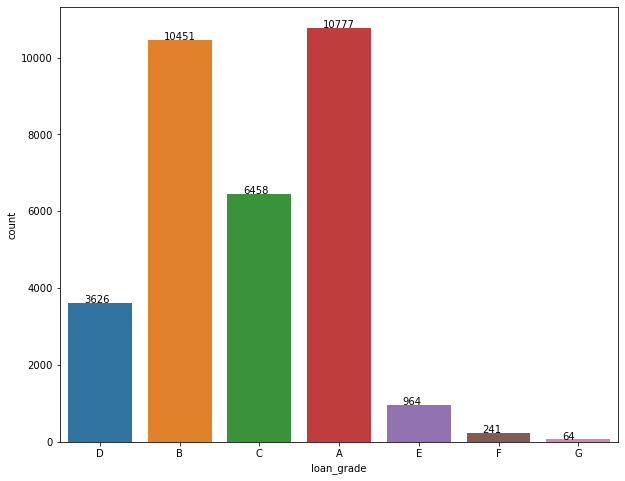

In [29]:
plt.figure(figsize=(10,8))
ax = sns.countplot(x='loan_grade', data=df)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.2, p.get_height()+0.1))

plt.show()

### loan_amnt

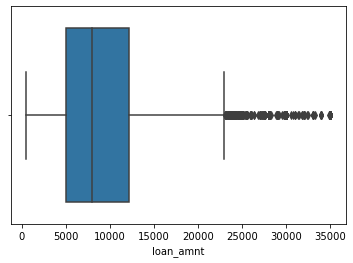

In [30]:
sns.boxplot(x='loan_amnt',data=df)
plt.show()

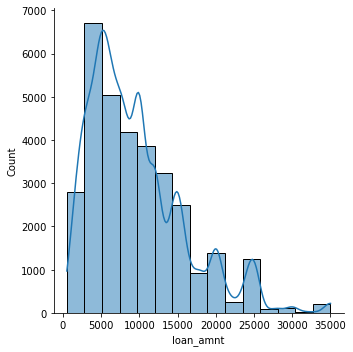

In [31]:
sns.displot(x='loan_amnt',data=df,kde=True,bins=15)
plt.show()

### loan_int_rate

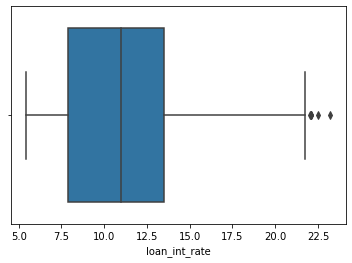

In [32]:
sns.boxplot(x='loan_int_rate',data=df)
plt.show()

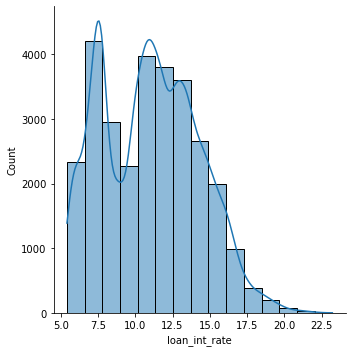

In [33]:
sns.displot(x='loan_int_rate',data=df,kde=True,bins=15)
plt.show()

### loan_status

In [34]:
print(df['loan_status'].nunique())
print(df['loan_status'].unique())

2
[1 0]


In [35]:
ex.pie(df,names='loan_status')

### loan_percent_income

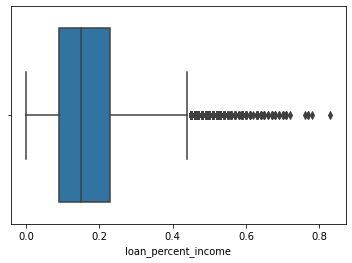

In [36]:
sns.boxplot(x='loan_percent_income',data=df)
plt.show()

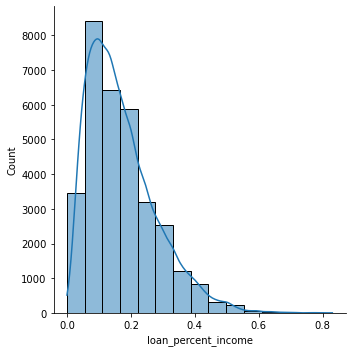

In [37]:
sns.displot(x='loan_percent_income',data=df,kde=True,bins=15)
plt.show()

### cb_person_default_on_file

In [38]:
print(df['cb_person_default_on_file'].nunique())
print(df['cb_person_default_on_file'].unique())

2
['Y' 'N']


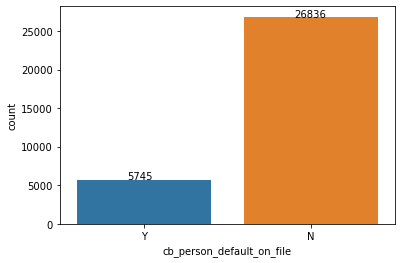

In [39]:
ax = sns.countplot(x='cb_person_default_on_file', data=df)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

### cb_person_cred_hist_length

In [40]:
df['cb_person_cred_hist_length'].min()

2

In [41]:
df['cb_person_cred_hist_length'].max()

30

In [42]:
df['cb_person_cred_hist_length'].mode()

0    2
dtype: int64

<function matplotlib.pyplot.show(close=None, block=None)>

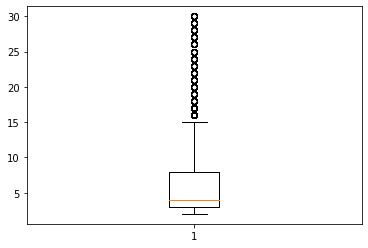

In [43]:
plt.boxplot(df['cb_person_cred_hist_length'])
plt.show

<Figure size 720x720 with 0 Axes>

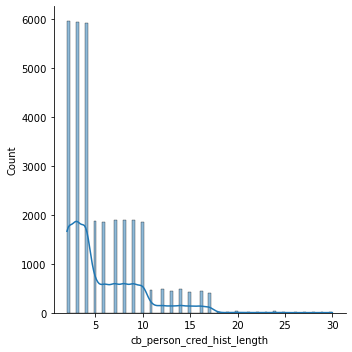

In [44]:
plt.figure(figsize=(10,10))
sns.displot(data=df,x='cb_person_cred_hist_length',kde=True)
plt.show()

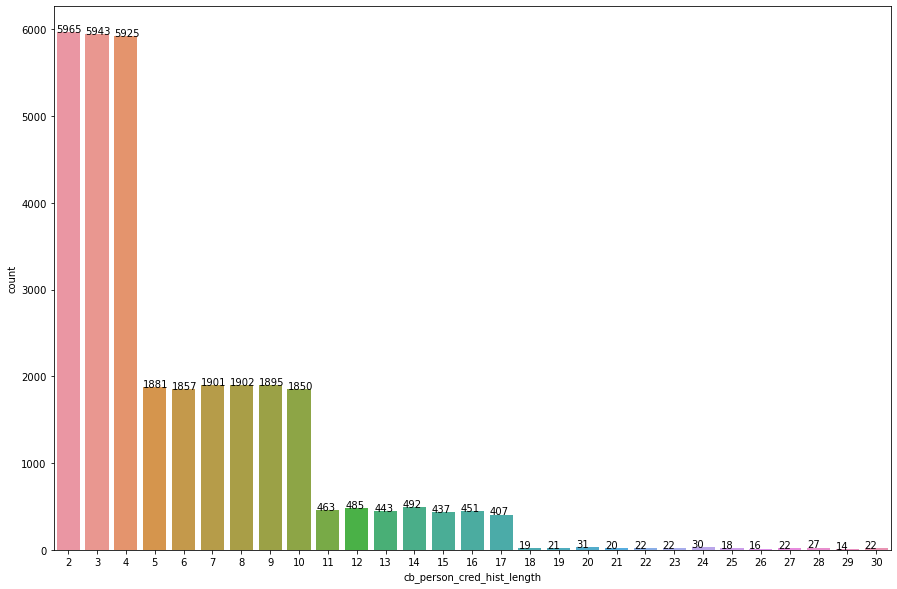

In [45]:
plt.figure(figsize=(15,10))
ax = sns.countplot(x='cb_person_cred_hist_length', data=df)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0, p.get_height()+0.1))

plt.show()

## Bivariate Analysis
Top 5 features:
- person_income
- loan_amnt
- loan_int_rate
- loan_status
- cb_person_default_on_file

In [46]:
df.head()

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3
3,23,65500,RENT,4.0,MEDICAL,C,35000,15.23,1,0.53,N,2
4,24,54400,RENT,8.0,MEDICAL,C,35000,14.27,1,0.55,Y,4


<AxesSubplot:xlabel='person_age', ylabel='count'>

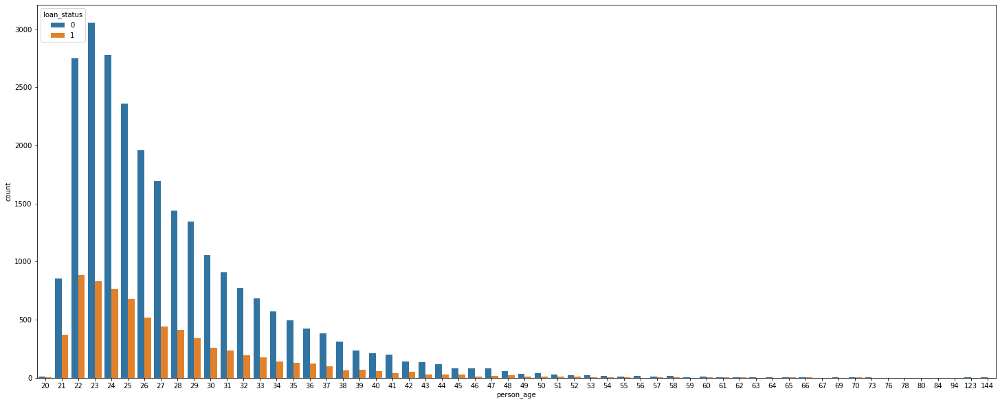

In [47]:
plt.figure(figsize=[25,10])
sns.countplot(x = 'person_age', hue= 'loan_status', data=df)

We can observe that people who are younger have a tendency not to pay the loan, 0 paid and 1 did not. The greatest default is among the youngest.

<AxesSubplot:xlabel='loan_grade', ylabel='person_income'>

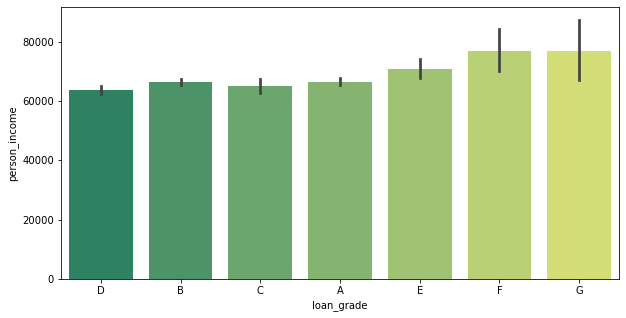

In [48]:
plt.figure(figsize=(10,5))

sns.barplot(x = df["loan_grade"], y = df["person_income"], palette="summer")

<AxesSubplot:xlabel='cb_person_default_on_file', ylabel='person_income'>

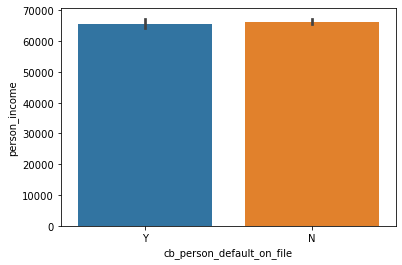

In [49]:
sns.barplot(x = df["cb_person_default_on_file"], y = df["person_income"])

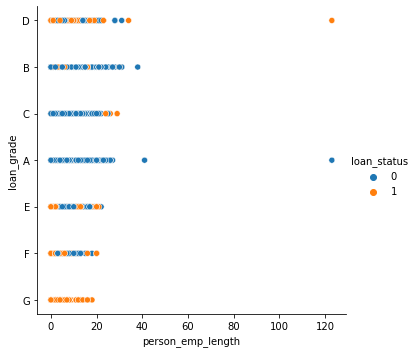

In [50]:
sns.relplot(data=df,x='person_emp_length',y='loan_grade',hue='loan_status')
plt.show()

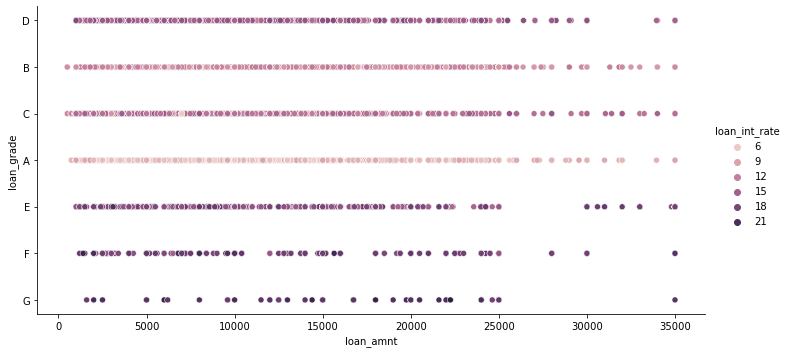

In [51]:
sns.relplot(data=df,x='loan_amnt',y='loan_grade',hue='loan_int_rate',height=5, aspect=2)
plt.show()

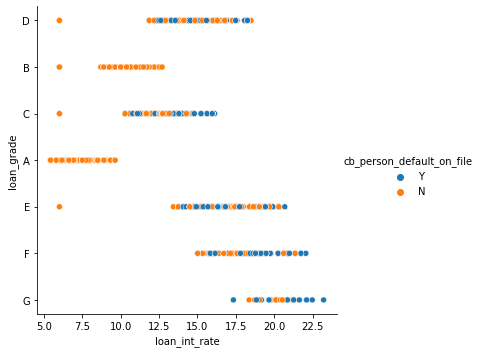

In [52]:
sns.relplot(data=df,x='loan_int_rate',y='loan_grade',hue='cb_person_default_on_file')
plt.show()

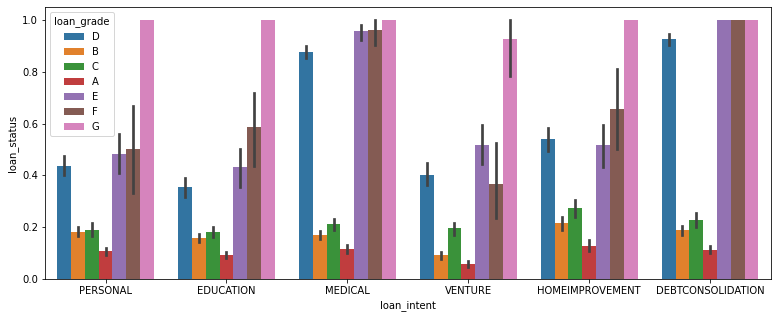

In [53]:
plt.figure(figsize=(13,5))
sns.barplot(y=df["loan_status"], x=df["loan_intent"], hue = 'loan_grade', data = df)
plt.show()

In [54]:
ln_0=df[df['loan_status']==0]
ln_0.head(2)


,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.1,N,2
14,23,115000,RENT,2.0,EDUCATION,A,35000,7.90,0,0.3,N,4


In [55]:
ln_1=df[df['loan_status']==1]
ln_1.head(2)


,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
2,25,9600,MORTGAGE,1.0,MEDICAL,C,5500,12.87,1,0.57,N,3


In [56]:
pd.crosstab(df['cb_person_default_on_file'], df['loan_grade'])

loan_grade,A,B,C,D,E,F,G
cb_person_default_on_file,,,,,,,
N,10777,10451,3202,1750,499,129,28
Y,0,0,3256,1876,465,112,36


In [57]:
default_hist_status_tab = pd.crosstab(df['cb_person_default_on_file'],df['loan_status'])
default_hist_status_tab

loan_status,0,1
cb_person_default_on_file,,
N,21900,4936
Y,3573,2172


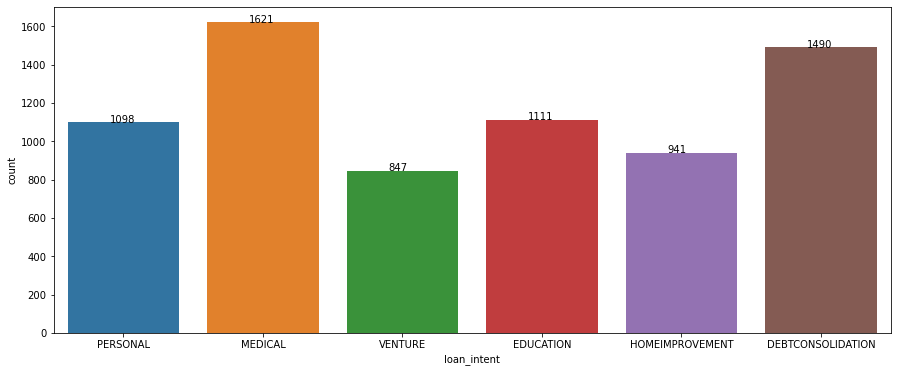

In [58]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='loan_intent', data=ln_1)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

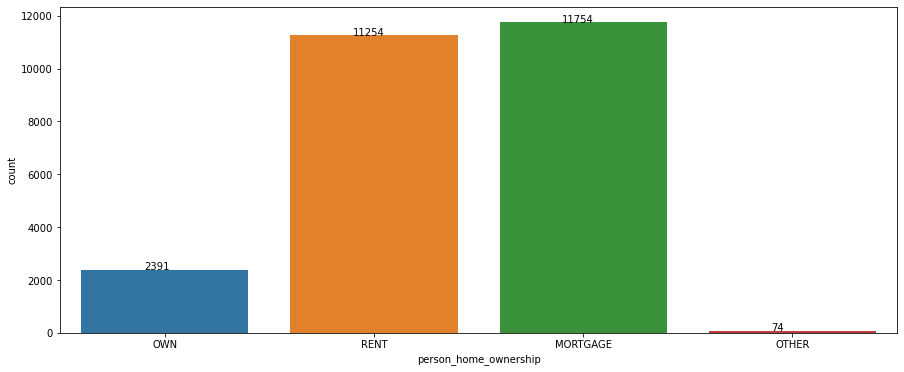

In [59]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='person_home_ownership', data=ln_0)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

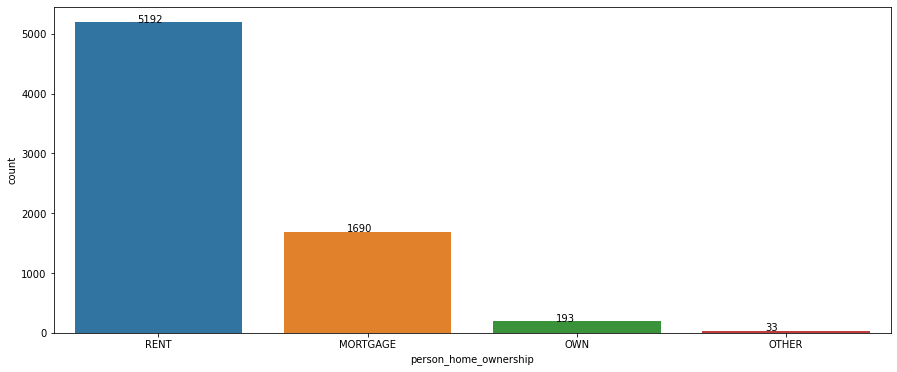

In [60]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='person_home_ownership', data=ln_1)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

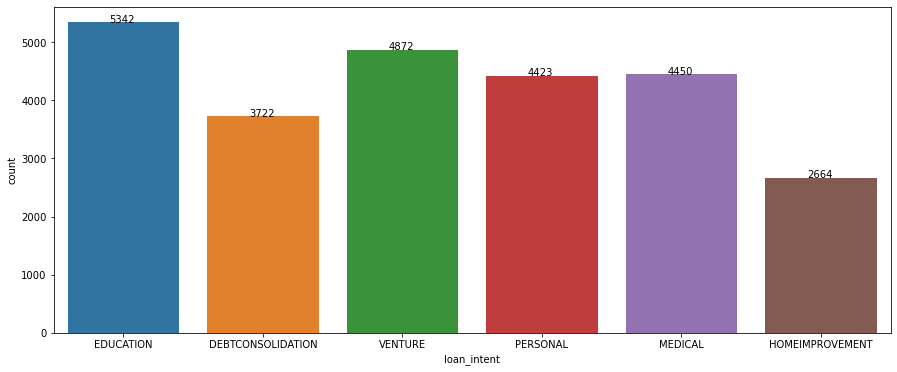

In [61]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='loan_intent', data=ln_0)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

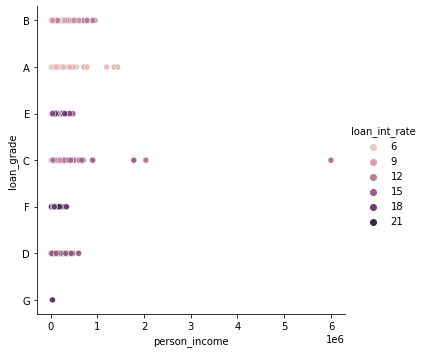

In [62]:
sns.relplot(data=ln_0,x='person_income',y='loan_grade',hue='loan_int_rate')
plt.show()

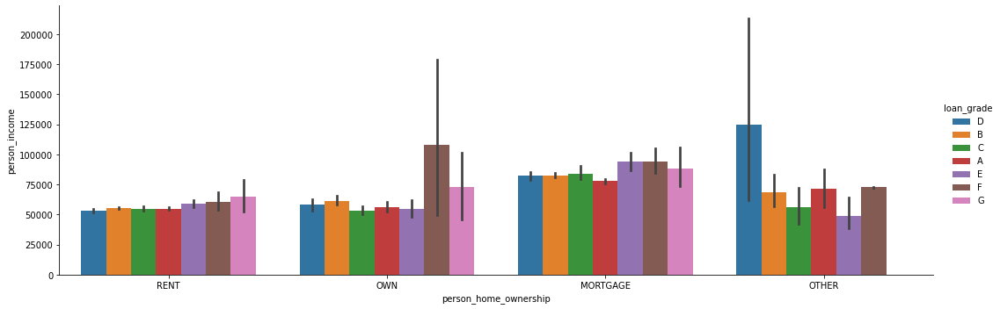

In [63]:
sns.catplot(y='person_income',kind='bar',hue='loan_grade',x='person_home_ownership',data=df,height=5, aspect=3)
plt.show()

<Figure size 3600x1440 with 0 Axes>

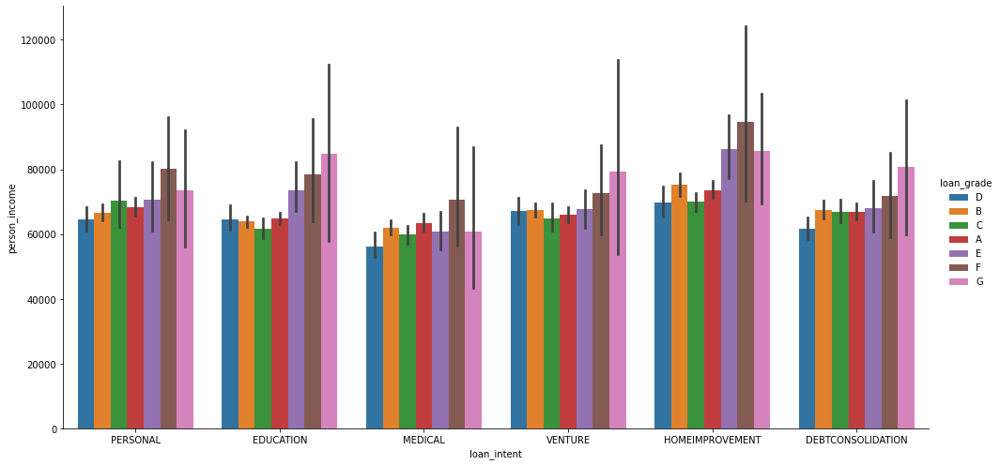

In [64]:
plt.figure(figsize=[50,20])
sns.catplot(y='person_income',kind='bar',hue='loan_grade',x='loan_intent',data=df,height=7, aspect=2)
plt.show()

In [65]:
df.head(2)

,person_age,person_income,person_home_ownership,person_emp_length,loan_intent,loan_grade,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_default_on_file,cb_person_cred_hist_length
0,22,59000,RENT,123.0,PERSONAL,D,35000,16.02,1,0.59,Y,3
1,21,9600,OWN,5.0,EDUCATION,B,1000,11.14,0,0.10,N,2


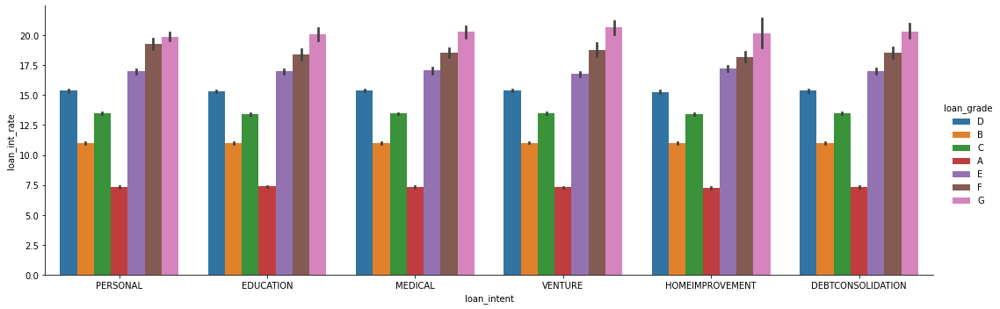

In [66]:
sns.catplot(y='loan_int_rate',kind='bar',hue='loan_grade',x='loan_intent',data=df,height=5, aspect=3)
plt.show()

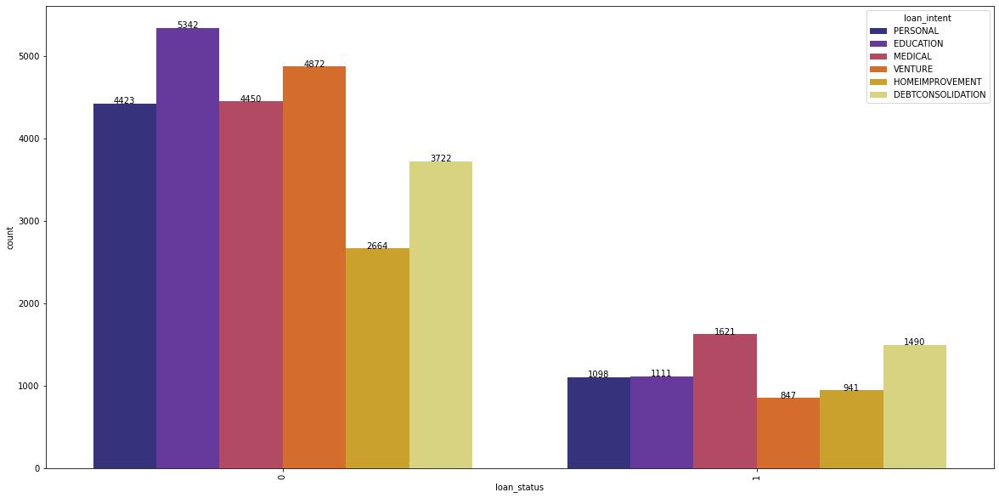

In [67]:
fig, ax1 = plt.subplots(figsize=(20,10))
graph = sns.countplot(ax=ax1,x='loan_status',hue="loan_intent",data=df, palette="CMRmap")
graph.set_xticklabels(graph.get_xticklabels(),rotation=90)
for p in graph.patches:
    height = p.get_height()
    graph.text(p.get_x()+p.get_width()/2., height + 0.1,height ,ha="center")

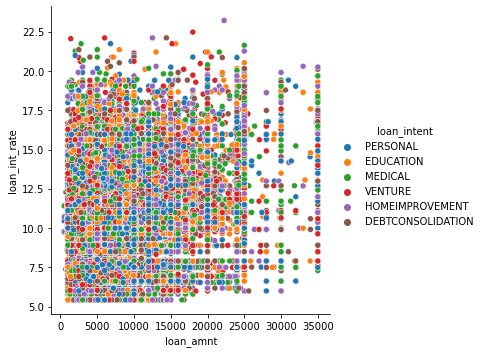

In [68]:
sns.relplot(data=df,x='loan_amnt',y='loan_int_rate',hue='loan_intent')
plt.show()

<AxesSubplot:xlabel='cb_person_default_on_file', ylabel='count'>

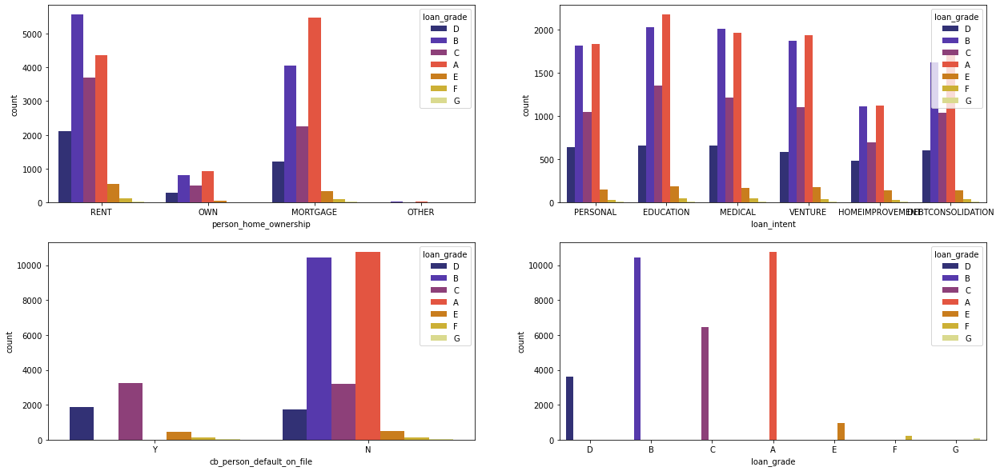

In [69]:
fig,axes = plt.subplots(2,2, figsize=(21,10))

sns.countplot('person_home_ownership',hue="loan_grade",data=df,ax=axes[0,0],palette='CMRmap')
sns.countplot('loan_intent',data=df,hue="loan_grade",ax=axes[0,1],palette='CMRmap')
sns.countplot('loan_grade',data=df,hue="loan_grade",ax=axes[1,1],palette='CMRmap')
sns.countplot('cb_person_default_on_file',hue="loan_grade",data=df,ax=axes[1,0],palette='CMRmap')

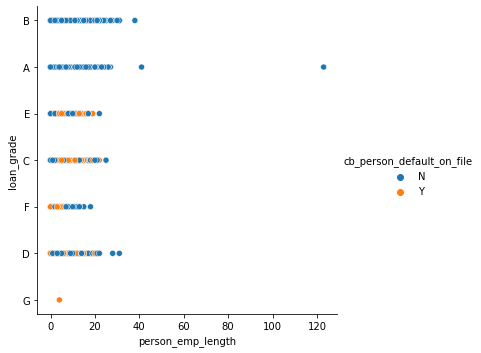

In [70]:
sns.relplot(data=ln_0,x='person_emp_length',y='loan_grade',hue='cb_person_default_on_file')
plt.show()

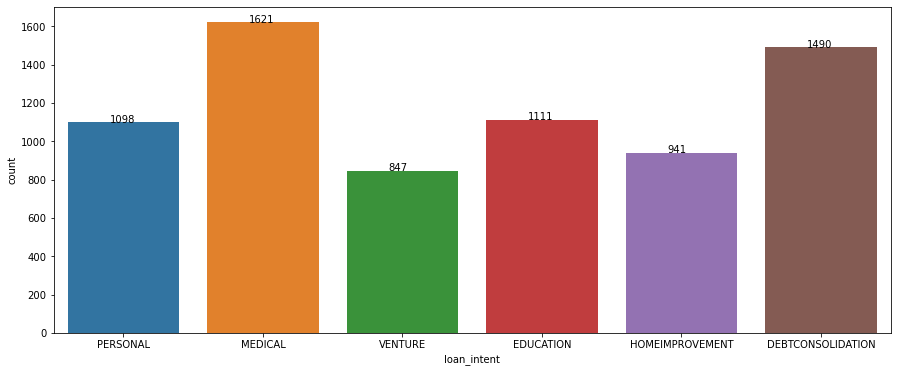

In [71]:
plt.figure(figsize=(15,6))
ax = sns.countplot(x='loan_intent', data=ln_1)
for p in ax.patches:
    ax.annotate('{:}'.format(p.get_height()), (p.get_x()+0.3, p.get_height()+0.1))

plt.show()

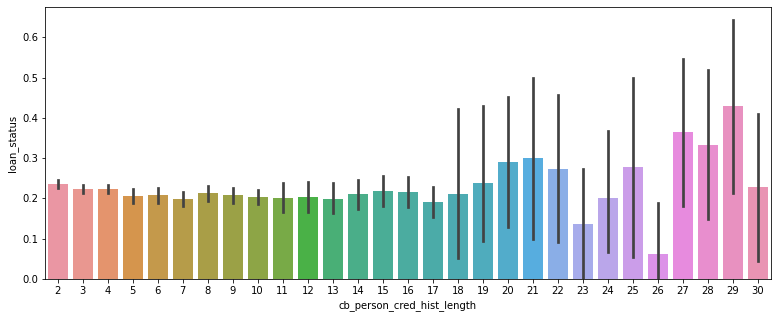

In [72]:
plt.figure(figsize=(13,5))
sns.barplot(y=df["loan_status"], x=df["cb_person_cred_hist_length"])
plt.show()

In [73]:
grafico = ex.parallel_categories(df, dimensions=['loan_intent', 'loan_grade', 'loan_status'])
grafico.show()

In [74]:
corr_matrix=df.corr()
corr_matrix

,person_age,person_income,person_emp_length,loan_amnt,loan_int_rate,loan_status,loan_percent_income,cb_person_cred_hist_length
person_age,1.000000,0.173202,0.163106,0.050787,0.012580,-0.021629,-0.042411,0.859133
person_income,0.173202,1.000000,0.134268,0.266820,0.000792,-0.144449,-0.254471,0.117987
person_emp_length,0.163106,0.134268,1.000000,0.113082,-0.056405,-0.082489,-0.054111,0.144699
loan_amnt,0.050787,0.266820,0.113082,1.000000,0.146813,0.105376,0.572612,0.041967
loan_int_rate,0.012580,0.000792,-0.056405,0.146813,1.000000,0.335133,0.120314,0.016696
loan_status,-0.021629,-0.144449,-0.082489,0.105376,0.335133,1.000000,0.379366,-0.015529
loan_percent_income,-0.042411,-0.254471,-0.054111,0.572612,0.120314,0.379366,1.000000,-0.031690
cb_person_cred_hist_length,0.859133,0.117987,0.144699,0.041967,0.016696,-0.015529,-0.031690,1.000000


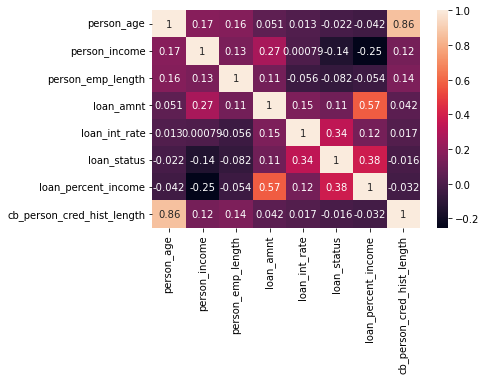

In [75]:
sns.heatmap(corr_matrix,annot=True)
plt.show()

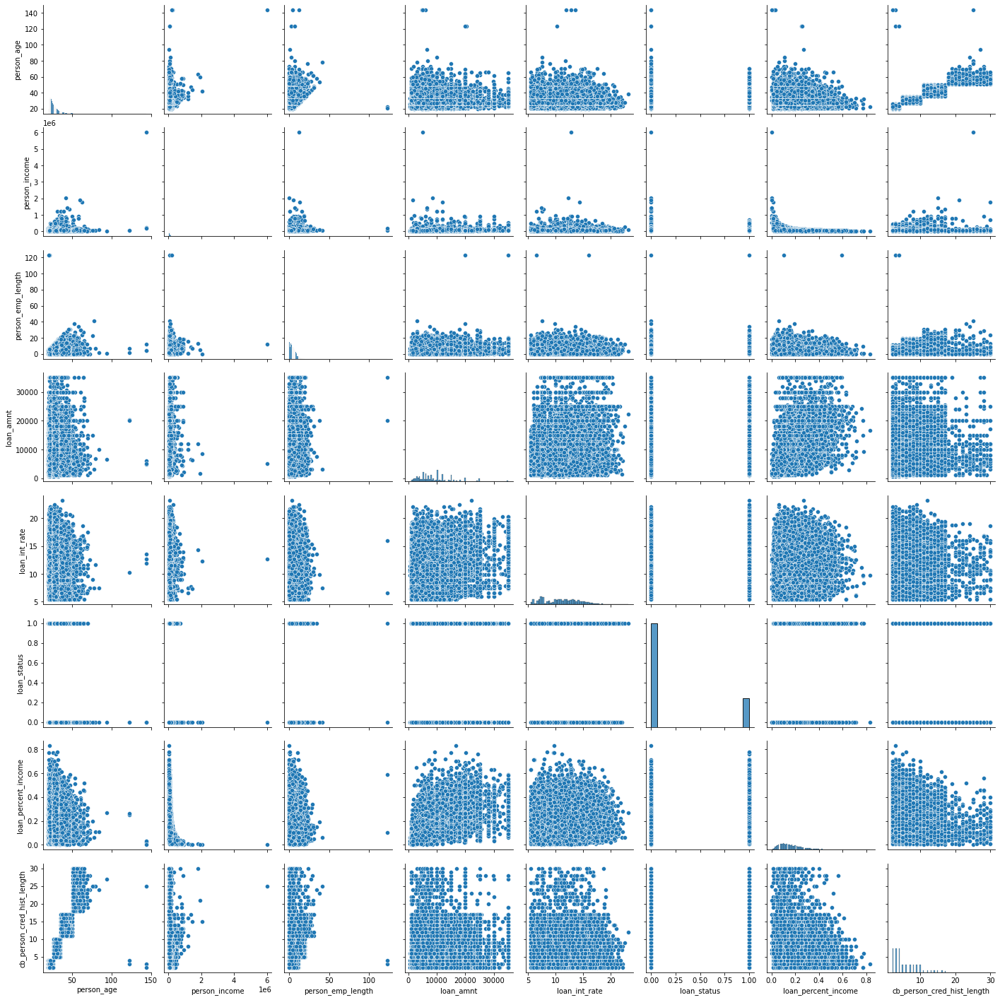

In [76]:
sns.pairplot(df)
plt.show()

In [77]:
import math
from collections import Counter
import scipy.stats as ss


#categorical correlation 
def conditional_entropy(x,y):
    # entropy of x given y
    y_counter = Counter(y)
    xy_counter = Counter(list(zip(x,y)))
    total_occurrences = sum(y_counter.values())
    entropy = 0
    for xy in xy_counter.keys():
        p_xy = xy_counter[xy] / total_occurrences
        p_y = y_counter[xy[1]] / total_occurrences
        entropy += p_xy * math.log(p_y/p_xy)
    return entropy

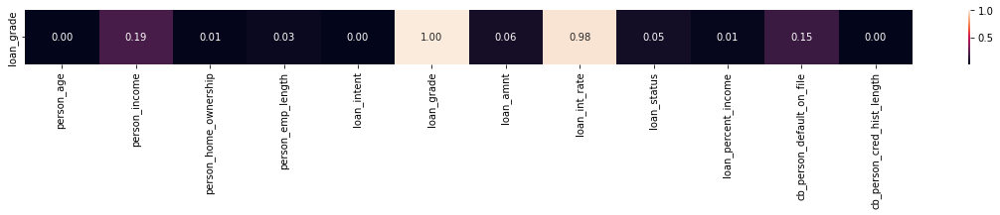

In [78]:
def theil_u(x,y):
    s_xy = conditional_entropy(x,y)
    x_counter = Counter(x)
    total_occurrences = sum(x_counter.values())
    p_x = list(map(lambda n: n/total_occurrences, x_counter.values()))
    s_x = ss.entropy(p_x)
    if s_x == 0:
        return 1
    else:
        return (s_x - s_xy) / s_x


theilu = pd.DataFrame(index=['loan_grade'],columns=df.columns)
columns = df.columns
for j in range(0,len(columns)):
    u = theil_u(df['loan_grade'].tolist(),df[columns[j]].tolist())
    theilu.loc[:,columns[j]] = u
theilu.fillna(value=np.nan,inplace=True)
plt.figure(figsize=(20,1))
sns.heatmap(theilu,annot=True,fmt='.2f')
plt.show() 